In [1]:
import rtree
import pandas
import json
import os

In [2]:
with open("../11-30-2022/6386d89efb3ff533c12df167__post10.json", "r") as f:
    full_data = json.load(f)

In [3]:
database_name = "road_data"
os.makedirs("road_data", exist_ok=True)
os.chdir(database_name)

In [4]:
roads = [1, 2] # Eastbound, Westbound
lanes = [-1, -2, -3, -4] # Innermost lanes to outermost lanes

'''
road_data_indices = {}
for road in roads:
    road_data_indices[road] = {}
    for lane in lanes:
        # Build the index
        p = rtree.index.Property()
        p.dimension = 2 # Time and longitudinal position
        idx = rtree.index.Index(f"road{road}lane{abs(lane)}", properties=p)
        road_data_indices[road][lane] = idx

'''


'\nroad_data_indices = {}\nfor road in roads:\n    road_data_indices[road] = {}\n    for lane in lanes:\n        # Build the index\n        p = rtree.index.Property()\n        p.dimension = 2 # Time and longitudinal position\n        idx = rtree.index.Index(f"road{road}lane{abs(lane)}", properties=p)\n        road_data_indices[road][lane] = idx\n\n'

In [5]:
with open("../../i24_motion_to_carla_mapping_adjusted_origin.json", "r") as f:
    mapping_data = json.load(f)

In [6]:
mapping_data

{'1': {'direction': 'eastbound',
  'origin_marker': 61.6,
  'origin_meter': 1677.726467042,
  'length': 1662.3987830189642,
  'outflow_ghost_region': [61.5, 61.55],
  'inflow_ghost_region': [60.65, 60.7],
  'normal_region': [60.7, 61.45],
  'longitudinal_occupancy_cell_delta_miles': 0.05,
  'lanes': 4},
 '2': {'direction': 'westbound',
  'origin_marker': 61.6,
  'origin_meter': 3.547548396,
  'length': 1663.0286378971887,
  'inflow_ghost_region': [61.55, 61.5],
  'outflow_ghost_region': [60.7, 60.65],
  'normal_region': [61.45, 60.7],
  'longitudinal_occupancy_cell_delta_miles': -0.05,
  'lanes': 4}}

In [6]:
mile_to_feet = 5280
feet_to_meters = 0.3048

road_lane_data = {
    1: {-1: [-24.0, -12.0], -2: [-36.0, -24.0], -3: [-48.0, -36.0], -4: [-60.0, -48.0]},
    2: {-1: [12.0, 24.0], -2: [24.0, 36.0], -3: [36.0, 48.0], -4: [48.0, 60.0]}
}

# We assume all the lanes are on the right of the reference line
def tConversionFunction(y_position):
    return ((abs(y_position) - 12.0) * feet_to_meters) * -1

def convertXPositionToMarker(x_position):
    return x_position / mile_to_feet

def westboundMarkerToS(marker):
    return (((mapping_data["2"]["origin_marker"] - marker) * mile_to_feet) * feet_to_meters) + mapping_data["2"]["origin_meter"]

def eastboundMarkerToS(marker):
    return (((marker - mapping_data["1"]["origin_marker"]) * mile_to_feet) * feet_to_meters) + mapping_data["1"]["origin_meter"]

def convertYPositionToRoadAndLaneAndT(y_position):
    t_position = tConversionFunction(y_position)
    for road in road_lane_data:
        for lane in road_lane_data[road]:
            bounds = road_lane_data[road][lane]
            if (y_position > bounds[0]) and (y_position < bounds[1]):
                return t_position, road, lane
    


In [ ]:
def processDataIntoDicts(source_data, roads, lanes, unique_id_count=1):
    road_lane_trajectory_data = {}
    for road in roads:
        road_lane_trajectory_data[road] = {}
        for lane in lanes:
            road_lane_trajectory_data[road][lane] = {
                "time": [],
                "x": [],
                "y": [],
                "length": [],
                "width": [],
                "height": [],
                "class": [],
                "id": [],
                "s": [],
                "t": []
            }
    for i, entry in enumerate(source_data):
        # Create separate entry for each
        print(i, unique_id_count)
        for j in range(len(entry["x_position"])):
            new_obj_time = entry["timestamp"][j]
            new_obj_x = entry["x_position"][j]
            new_obj_y = entry["y_position"][j]
            new_obj_length = entry["length"]
            new_obj_width = entry["width"]
            new_obj_height = entry["height"]
            new_obj_class = entry["coarse_vehicle_class"]
            #new_obj["fine_vehicle_class"] = entry["fine_vehicle_class"]
            #new_obj["direction"] = entry["direction"]
            #new_obj["starting_x"] = entry["starting_x"]
            #new_obj["first_timestamp"] = entry["first_timestamp"]
            #new_obj["ending_x"] = entry["ending_x"]
            #new_obj["last_timestamp"] = entry["last_timestamp"]

            marker = convertXPositionToMarker(new_obj_x)
            res = convertYPositionToRoadAndLaneAndT(new_obj_y)
            if (res == None):
                continue
            new_obj_t, new_obj_road, new_obj_lane = res
            new_obj_s = None
            #Eastbound
            if new_obj_road == 1:
                new_obj_s = eastboundMarkerToS(marker)
            # Westbound
            elif new_obj_road == 2:
                new_obj_s = westboundMarkerToS(marker)

            new_obj_id = unique_id_count
            #road_lane_trajectory_data.append(new_obj)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["time"].append(new_obj_time)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["x"].append(new_obj_x)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["y"].append(new_obj_y)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["length"].append(new_obj_length)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["width"].append(new_obj_width)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["height"].append(new_obj_height)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["class"].append(new_obj_class)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["s"].append(new_obj_s)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["t"].append(new_obj_t)
            road_lane_trajectory_data[new_obj_road][new_obj_lane]["id"].append(new_obj_id)
            #selected_index = road_data_indices[road][lane]
            #selected_index.insert(id=unique_id_count, coordinates=(new_obj["timestamp"], new_obj["s"], new_obj["timestamp"], new_obj["s"]), obj=new_obj)
        unique_id_count += 1
    return road_lane_trajectory_data

In [27]:
road_lane_trajectory_data = processDataIntoDicts(full_data, roads, lanes)
#print("lol")

0 1
1 2
2 3
3 4
4 5
5 6
6 7
7 8
8 9
9 10
10 11
11 12
12 13
13 14
14 15
15 16
16 17
17 18
18 19
19 20
20 21
21 22
22 23
23 24
24 25
25 26
26 27
27 28
28 29
29 30
30 31
31 32
32 33
33 34
34 35
35 36
36 37
37 38
38 39
39 40
40 41
41 42
42 43
43 44
44 45
45 46
46 47
47 48
48 49
49 50
50 51
51 52
52 53
53 54
54 55
55 56
56 57
57 58
58 59
59 60
60 61
61 62
62 63
63 64
64 65
65 66
66 67
67 68
68 69
69 70
70 71
71 72
72 73
73 74
74 75
75 76
76 77
77 78
78 79
79 80
80 81
81 82
82 83
83 84
84 85
85 86
86 87
87 88
88 89
89 90
90 91
91 92
92 93
93 94
94 95
95 96
96 97
97 98
98 99
99 100
100 101
101 102
102 103
103 104
104 105
105 106
106 107
107 108
108 109
109 110
110 111
111 112
112 113
113 114
114 115
115 116
116 117
117 118
118 119
119 120
120 121
121 122
122 123
123 124
124 125
125 126
126 127
127 128
128 129
129 130
130 131
131 132
132 133
133 134
134 135
135 136
136 137
137 138
138 139
139 140
140 141
141 142
142 143
143 144
144 145
145 146
146 147
147 148
148 149
149 150
150 151
151 152
15

In [35]:
len(road_lane_trajectory_data[2][-1]["id"])

63955632

In [43]:
def generator_function(road_and_lane_data):
    print(len(road_and_lane_data["id"]))
    for i in range(len(road_and_lane_data["id"])):
        new_obj = {
            "time": road_and_lane_data["time"][i],
            "x": road_and_lane_data["x"][i],
            "y": road_and_lane_data["y"][i],
            "length": road_and_lane_data["length"][i],
            "width": road_and_lane_data["width"][i],
            "height": road_and_lane_data["height"][i],
            "class": road_and_lane_data["class"][i],
            "id": road_and_lane_data["id"][i],
            "s": road_and_lane_data["s"][i],
            "t": road_and_lane_data["t"][i]
        }
        yield (road_and_lane_data["id"][i], (new_obj["time"], new_obj["s"], new_obj["time"], new_obj["s"]), new_obj)

road_data_indices = {}
for road in roads:
    road_data_indices[road] = {}
    for lane in lanes:
        print(road, lane)
        # Build the index
        p = rtree.index.Property()
        p.dimension = 2 # Time and longitudinal position
        idx = rtree.index.Index(filename=f"road{road}lane{abs(lane)}", stream=generator_function(road_lane_trajectory_data[road][lane]), properties=p)
        road_data_indices[road][lane] = idx
        print("Going")

1 -1
Going
1 -2
Going
1 -3
Going
1 -4
Going
2 -1
Going
2 -2
Going
2 -3
Going
2 -4
Going


In [42]:
for road in roads:
    for lane in lanes:
        print(road, lane, len(road_lane_trajectory_data[road][lane]["id"]), "a")

1 -1 13816679 a
1 -2 16094273 a
1 -3 13233684 a
1 -4 11412283 a
2 -1 63955632 a
2 -2 50902900 a
2 -3 42684944 a
2 -4 48683046 a


# Lets try using duckDB and parquet instead!

In [44]:
import pyarrow as pa
import pyarrow.parquet as pq
import pandas
for road in roads:
    for lane in lanes:
        road_lane_trajectory = road_lane_trajectory_data[road][lane]
        pandas_df = pandas.DataFrame(road_lane_trajectory)
        pandas_df_sorted = pandas_df.sort_values(["time", "s"], kind="mergesort")
        table = pa.Table.from_pandas(pandas_df_sorted, preserve_index=False)
        pq.write_table(table, f"road{road}lane{lane}.parquet", compression="zstd", row_group_size=1000)
        print("Written ", road, " and lane ", lane)

Written  1  and lane  -1
Written  1  and lane  -2
Written  1  and lane  -3
Written  1  and lane  -4
Written  2  and lane  -1
Written  2  and lane  -2
Written  2  and lane  -3
Written  2  and lane  -4


# Lets test this!

In [2]:
import duckdb
import pandas
conn = duckdb.connect()
conn.execute(""" 
    CREATE VIEW trajectories3 AS
    SELECT * FROM parquet_scan('road_data/road2lane-1.parquet')             
""")


In [3]:
def queryEdieBox(conn, time_min, time_max, s_min, s_max):
    q = """
    SELECT time, x, y, length, width, height, class, id, s, t
    FROM trajectories3
    WHERE time BETWEEN ? AND ?
    AND s BETWEEN ? AND ?
    """
    return conn.execute(q, [time_min, time_max, s_min, s_max]).fetch_df()

def queryEdieBoxDF(data, time_min, time_max, s_min, s_max):
    result_df = {}
    for key in data:
        result_df[key] = []
    for i in range(len(data["x"])):
        if (data["time"][i] >= time_min) and (data["time"][i] <= time_max) and (data["s"][i] >= s_min) and (data["s"][i] <= s_max):
            for key in data:
                result_df[key].append(data[key][i])
    return pandas.DataFrame(result_df)

In [11]:
edie_box_sample = queryEdieBox(conn, 1669812000.0, 1669812001, 0, 50)

In [5]:
import matplotlib.pyplot as plt
def plotRoadAndLane(data):
    fig, ax = plt.subplots(figsize=(16, 12))
    unique_values = data["id"].unique()
    for entry_id in unique_values:
        entry = data[data["id"] == entry_id]
        ax.plot(entry["time"], entry["s"], linewidth=0.5)
    ax.set_title(f"Edie Box Data")
    fig.show()


/tmp/ipykernel_916665/3442728101.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


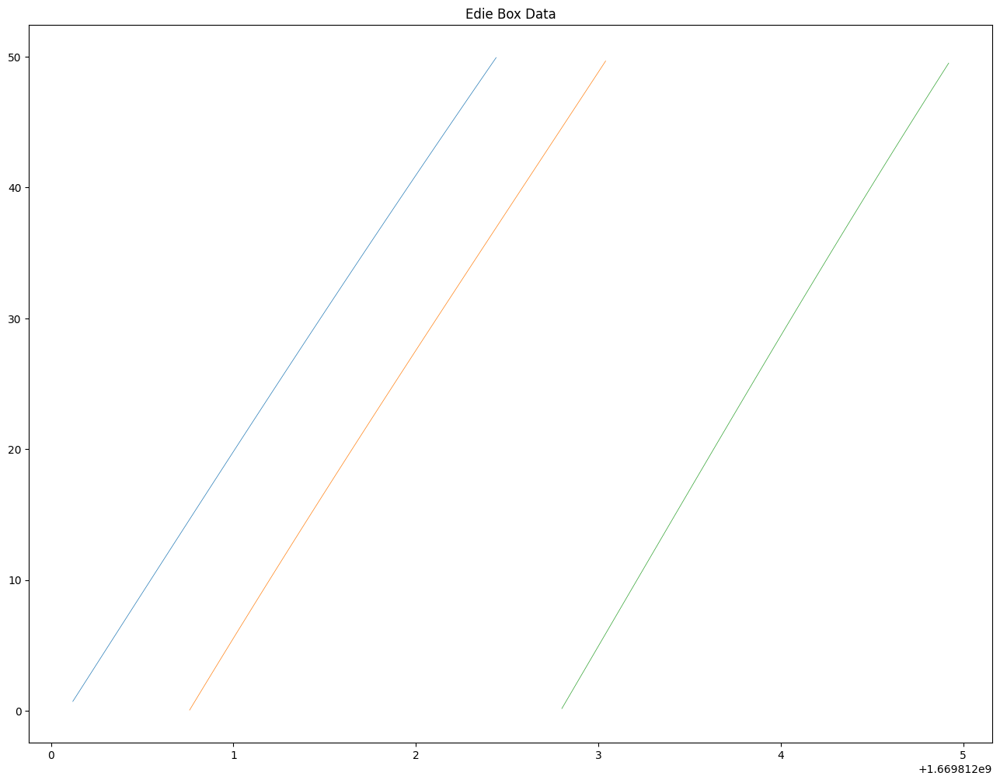

In [8]:
plotRoadAndLane(edie_box_sample)

In [12]:
edie_box_sample

,time,x,y,length,width,height,class,id,s,t
0,1.669812e+09,325257.320255,15.838632,16.955179,5.581714,5.359135,0,164393,0.706735,-1.170015
1,1.669812e+09,325254.459750,15.864611,16.955179,5.581714,5.359135,0,164393,1.578617,-1.177933
2,1.669812e+09,325251.599340,15.890162,16.955179,5.581714,5.359135,0,164393,2.450469,-1.185721
3,1.669812e+09,325248.739169,15.915285,16.955179,5.581714,5.359135,0,164393,3.322250,-1.193379
4,1.669812e+09,325245.879383,15.939980,16.955179,5.581714,5.359135,0,164393,4.193912,-1.200906
5,1.669812e+09,325243.020132,15.964250,16.955179,5.581714,5.359135,0,164393,5.065412,-1.208303
6,1.669812e+09,325240.161568,15.988093,16.955179,5.581714,5.359135,0,164393,5.936702,-1.215571
7,1.669812e+09,325237.303847,16.011512,16.955179,5.581714,5.359135,0,164393,6.807736,-1.222709
8,1.669812e+09,325234.447125,16.034506,16.955179,5.581714,5.359135,0,164393,7.678465,-1.229717
9,1.669812e+09,325231.591562,16.057076,16.955179,5.581714,5.359135,0,164393,8.548840,-1.236597
